# Import packages and set seed for reproducibility

In [28]:
import sys
#conda install --yes --prefix {sys.prefix} albumentations

In [29]:
import torch
torch.cuda.is_available()
torch.cuda.device_count()
torch.cuda.current_device()
torch.cuda.device(0)
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 3050 Laptop GPU'

In [30]:
import os
import sys
import json
import time
import random

import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import normalize

import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import seaborn as sn

from tqdm import tqdm
from tqdm.contrib.concurrent import process_map

import cv2

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader

import albumentations as album

In [31]:
def set_seed(seed, use_gpu = True):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if use_gpu:
        print("CUDA is available")
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

SEED = 12345
USE_SEED = True

if USE_SEED:
    set_seed(SEED, torch.cuda.is_available())

CUDA is available


# Use metadata to get image and mask paths

In [32]:
DATA_PATH = "./data"

## Read files

In [33]:
train_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "train_metadata_patches.csv"))
print(train_metadata_df.shape)

train_metadata_df.head()

(42336, 3)


,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001290139-MSS1,train_patches/GF2_PMS1__L1A0001290139-MSS1_sat...,train_patches/GF2_PMS1__L1A0001290139-MSS1_mas...
1,GF2_PMS1__L1A0001290139-MSS1,train_patches/GF2_PMS1__L1A0001290139-MSS1_sat...,train_patches/GF2_PMS1__L1A0001290139-MSS1_mas...
2,GF2_PMS1__L1A0001290139-MSS1,train_patches/GF2_PMS1__L1A0001290139-MSS1_sat...,train_patches/GF2_PMS1__L1A0001290139-MSS1_mas...
3,GF2_PMS1__L1A0001290139-MSS1,train_patches/GF2_PMS1__L1A0001290139-MSS1_sat...,train_patches/GF2_PMS1__L1A0001290139-MSS1_mas...
4,GF2_PMS1__L1A0001290139-MSS1,train_patches/GF2_PMS1__L1A0001290139-MSS1_sat...,train_patches/GF2_PMS1__L1A0001290139-MSS1_mas...


In [34]:
valid_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "valid_metadata_patches.csv"))
print(valid_metadata_df.shape)

valid_metadata_df.head()

(1568, 3)


,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001344822-MSS1,valid_patches/GF2_PMS1__L1A0001344822-MSS1_sat...,valid_patches/GF2_PMS1__L1A0001344822-MSS1_mas...
1,GF2_PMS1__L1A0001344822-MSS1,valid_patches/GF2_PMS1__L1A0001344822-MSS1_sat...,valid_patches/GF2_PMS1__L1A0001344822-MSS1_mas...
2,GF2_PMS1__L1A0001344822-MSS1,valid_patches/GF2_PMS1__L1A0001344822-MSS1_sat...,valid_patches/GF2_PMS1__L1A0001344822-MSS1_mas...
3,GF2_PMS1__L1A0001344822-MSS1,valid_patches/GF2_PMS1__L1A0001344822-MSS1_sat...,valid_patches/GF2_PMS1__L1A0001344822-MSS1_mas...
4,GF2_PMS1__L1A0001344822-MSS1,valid_patches/GF2_PMS1__L1A0001344822-MSS1_sat...,valid_patches/GF2_PMS1__L1A0001344822-MSS1_mas...


In [35]:
test_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "test_metadata_patches.csv"))
print(test_metadata_df.shape)

test_metadata_df.head()

(1568, 3)


,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001015646-MSS1,test_patches/GF2_PMS1__L1A0001015646-MSS1_sat_...,test_patches/GF2_PMS1__L1A0001015646-MSS1_mask...
1,GF2_PMS1__L1A0001015646-MSS1,test_patches/GF2_PMS1__L1A0001015646-MSS1_sat_...,test_patches/GF2_PMS1__L1A0001015646-MSS1_mask...
2,GF2_PMS1__L1A0001015646-MSS1,test_patches/GF2_PMS1__L1A0001015646-MSS1_sat_...,test_patches/GF2_PMS1__L1A0001015646-MSS1_mask...
3,GF2_PMS1__L1A0001015646-MSS1,test_patches/GF2_PMS1__L1A0001015646-MSS1_sat_...,test_patches/GF2_PMS1__L1A0001015646-MSS1_mask...
4,GF2_PMS1__L1A0001015646-MSS1,test_patches/GF2_PMS1__L1A0001015646-MSS1_sat_...,test_patches/GF2_PMS1__L1A0001015646-MSS1_mask...


## Change paths

In [36]:
train_metadata_df["sat_image_path"] = train_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
train_metadata_df["mask_path"] = train_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

train_metadata_df.head()

,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001290139-MSS1,./data\train_patches/GF2_PMS1__L1A0001290139-M...,./data\train_patches/GF2_PMS1__L1A0001290139-M...
1,GF2_PMS1__L1A0001290139-MSS1,./data\train_patches/GF2_PMS1__L1A0001290139-M...,./data\train_patches/GF2_PMS1__L1A0001290139-M...
2,GF2_PMS1__L1A0001290139-MSS1,./data\train_patches/GF2_PMS1__L1A0001290139-M...,./data\train_patches/GF2_PMS1__L1A0001290139-M...
3,GF2_PMS1__L1A0001290139-MSS1,./data\train_patches/GF2_PMS1__L1A0001290139-M...,./data\train_patches/GF2_PMS1__L1A0001290139-M...
4,GF2_PMS1__L1A0001290139-MSS1,./data\train_patches/GF2_PMS1__L1A0001290139-M...,./data\train_patches/GF2_PMS1__L1A0001290139-M...


In [37]:
valid_metadata_df["sat_image_path"] = valid_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
valid_metadata_df["mask_path"] = valid_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

valid_metadata_df.head()

,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001344822-MSS1,./data\valid_patches/GF2_PMS1__L1A0001344822-M...,./data\valid_patches/GF2_PMS1__L1A0001344822-M...
1,GF2_PMS1__L1A0001344822-MSS1,./data\valid_patches/GF2_PMS1__L1A0001344822-M...,./data\valid_patches/GF2_PMS1__L1A0001344822-M...
2,GF2_PMS1__L1A0001344822-MSS1,./data\valid_patches/GF2_PMS1__L1A0001344822-M...,./data\valid_patches/GF2_PMS1__L1A0001344822-M...
3,GF2_PMS1__L1A0001344822-MSS1,./data\valid_patches/GF2_PMS1__L1A0001344822-M...,./data\valid_patches/GF2_PMS1__L1A0001344822-M...
4,GF2_PMS1__L1A0001344822-MSS1,./data\valid_patches/GF2_PMS1__L1A0001344822-M...,./data\valid_patches/GF2_PMS1__L1A0001344822-M...


In [38]:
test_metadata_df["sat_image_path"] = test_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
test_metadata_df["mask_path"] = test_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

test_metadata_df.head()

,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001015646-MSS1,./data\test_patches/GF2_PMS1__L1A0001015646-MS...,./data\test_patches/GF2_PMS1__L1A0001015646-MS...
1,GF2_PMS1__L1A0001015646-MSS1,./data\test_patches/GF2_PMS1__L1A0001015646-MS...,./data\test_patches/GF2_PMS1__L1A0001015646-MS...
2,GF2_PMS1__L1A0001015646-MSS1,./data\test_patches/GF2_PMS1__L1A0001015646-MS...,./data\test_patches/GF2_PMS1__L1A0001015646-MS...
3,GF2_PMS1__L1A0001015646-MSS1,./data\test_patches/GF2_PMS1__L1A0001015646-MS...,./data\test_patches/GF2_PMS1__L1A0001015646-MS...
4,GF2_PMS1__L1A0001015646-MSS1,./data\test_patches/GF2_PMS1__L1A0001015646-MS...,./data\test_patches/GF2_PMS1__L1A0001015646-MS...


# Get class names and RGB values

In [39]:
class_dict = pd.read_csv(os.path.join(DATA_PATH, "class_dict.csv"))
class_dict

,name,r,g,b
0,built-up,255,0,0
1,farmland,0,255,0
2,forest,0,255,255
3,meadow,255,255,0
4,water,0,0,255
5,unknown,0,0,0


In [40]:
# list of class names
class_names = class_dict["name"].tolist()
# list of RGB values for each class
class_rgb_values = class_dict[["r", "g", "b"]].values.tolist()

In [41]:
format_spec = "{:<20} {:<20}"

print(format_spec.format("class name:", "class RGB values:"), "\n")

for i in range(len(class_names)):
    print(format_spec.format(str(class_names[i]), str(class_rgb_values[i])))

class name:          class RGB values:    

built-up             [255, 0, 0]         
farmland             [0, 255, 0]         
forest               [0, 255, 255]       
meadow               [255, 255, 0]       
water                [0, 0, 255]         
unknown              [0, 0, 0]           


# Shuffle data and select train, valid, and test set sizes

In [42]:
train_metadata_df_shuffled = train_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
train_df = train_metadata_df_shuffled.iloc[:60000]
print("train:", len(train_df))

train: 42336


In [43]:
valid_metadata_df_shuffled = valid_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
valid_df = valid_metadata_df_shuffled.iloc[:8000]
print("valid:", len(valid_df))

valid: 1568


In [44]:
test_metadata_df_shuffled = test_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
test_df = test_metadata_df_shuffled.iloc[:8000]
print("test:", len(test_df))

test: 1568


# Get size of an image and a mask 

In [45]:
# get image and mask paths of an image
idx = 1
image_path = train_df["sat_image_path"][idx]
mask_path = train_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)


def get_size(image, mask):

    format_spec = "{:<10} {:<26} {:<18} {:<16} {:<14}"

    image_size = sys.getsizeof(image)/10**6
    mask_size = sys.getsizeof(mask)/10**6

    if torch.is_tensor(image) and torch.is_tensor(mask):
        image_size = sys.getsizeof(image.storage())/10**6
        mask_size = sys.getsizeof(mask.storage())/10**6

    print(format_spec.format("name:", "object type:", "shape:", "data type:", "size [Mb]:"), "\n")
    print(format_spec.format("image", str(type(image)), str(list(image.shape)), str(image.dtype), str(round(image_size, 2))))
    print(format_spec.format("mask", str(type(mask)), str(list(mask.shape)), str(mask.dtype), str(round(mask_size, 2))))

get_size(image, mask)

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'numpy.ndarray'>    [256, 256, 3]      uint8            0.2           
mask       <class 'numpy.ndarray'>    [256, 256, 3]      uint8            0.2           


# Visualize images and masks

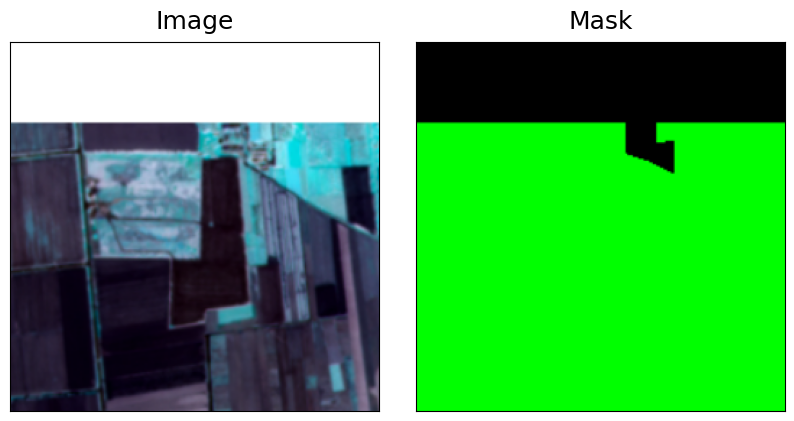

In [46]:
# get image and mask paths of an image
idx = 1
image_path = train_df["sat_image_path"][idx]
mask_path = train_df["mask_path"][idx]

# read image and mask into a numpy array
image = cv2.imread(image_path)
mask = cv2.imread(mask_path)

# plot image
fig = plt.figure(figsize = (10,5))
fig.subplots_adjust(wspace = 0.1, hspace = 0.1)

plt.subplot(1,2,1)
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.title("Image", fontsize = 18, pad = 10)

plt.subplot(1,2,2)
plt.imshow(mask)
plt.xticks([])
plt.yticks([])
plt.title("Mask", fontsize = 18, pad = 10)

plt.show()

# Define functions for different encodings (one-hot <> rgb <> dense)

In [47]:
def rgb_to_one_hot_econding(mask_rgb, class_rgb_values):

    if mask_rgb.shape[2] != 3:
        raise ValueError("The number of channels must be 3")

    mask_one_hot = np.zeros((mask_rgb.shape[0], mask_rgb.shape[1], len(class_rgb_values)), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        # np.equal(x, y): return (x == y) element-wise (the smaller array is broadcast to the larger one)
        # np.all(z): test whether all array elements along a given axis evaluate to True
        # numpy automatically converts bool to uint8
        mask_one_hot[:,:,i] = np.all(np.equal(mask_rgb, rgb), axis = -1)

    return mask_one_hot

In [48]:
def rgb_to_dense_encoding(mask_rgb, class_rgb_values):

    if mask_rgb.shape[2] != 3:
        raise ValueError("The number of channels must be 3")

    mask_dense = np.zeros((mask_rgb.shape[0], mask_rgb.shape[1]), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        # np.equal(x, y): return (x == y) element-wise (the smaller array is broadcast to the larger one)
        # np.all(z): test whether all array elements along a given axis evaluate to True
        mask_dense[np.all(np.equal(mask_rgb, rgb), axis = -1)] = i

    return mask_dense

In [49]:
def dense_to_rgb_encoding(mask_dense, class_rgb_values):

    if len(mask_dense.shape) != 2:
        raise ValueError("The number of channels must be 1")

    mask_rgb = np.zeros((mask_dense.shape[0], mask_dense.shape[1], 3), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        mask_rgb[mask_dense == i,:] = rgb

    return mask_rgb

In [50]:
def one_hot_to_rgb_encoding(mask_one_hot, class_rgb_values):

    if mask_one_hot.shape[2] != len(class_rgb_values):
        raise ValueError("The number of channels must be " + str(len(class_rgb_values)))

    mask_dense = np.argmax(mask_one_hot, axis = -1)
    mask_rgb = dense_to_rgb_encoding(mask_dense, class_rgb_values)

    return mask_rgb

# Class distributions and weights (median frequency balancing)

In [51]:
FREQ = True

In [52]:
def task_pixels(mask_path):

    mask = cv2.imread(mask_path)
    mask = rgb_to_dense_encoding(mask, class_rgb_values)

    # compute number of pixels of each class present in mask
    unique, counts = np.unique(mask, return_counts = True)
    return (unique, counts)

if FREQ:
    sparse_pixels = [task_pixels(path) for path in tqdm(train_df["mask_path"].tolist())]



    pixels = np.zeros((len(sparse_pixels), 7))

    for i in range(len(sparse_pixels)):
        pixels[i, sparse_pixels[i][0]] = sparse_pixels[i][1]

100%|██████████| 42336/42336 [08:25<00:00, 83.77it/s]


In [53]:
import numpy as np

# Anggap 'pixels' adalah numpy array dengan ukuran (jumlah_gambar, jumlah_kelas)
# Dimana pixels[i, j] menyimpan jumlah piksel kelas j di gambar i.

# Jika 'pixels' belum ada, Anda harus mengumpulkan data tersebut terlebih dahulu.
# Contohnya, dengan menggunakan task_pixels yang telah Anda definisikan untuk setiap gambar.

# Misal 'pixels' sudah diisi dengan benar:
# pixels = np.array([[jumlah_kelas1_gambar1, jumlah_kelas2_gambar1, ...],
#                    [jumlah_kelas1_gambar2, jumlah_kelas2_gambar2, ...],
#                    ...
#                   ])

# Hitung total piksel per kelas di seluruh dataset
total_pixels_per_class = pixels.sum(axis=0)

# Hitung total piksel di semua gambar
total_pixels = total_pixels_per_class.sum()

# Hitung distribusi piksel per kelas
distr = total_pixels_per_class / total_pixels

# Verifikasi bahwa jumlah dari semua distribusi adalah 1 (atau sangat mendekati 1)
assert np.isclose(distr.sum(), 1), "Jumlah distribusi tidak sama dengan 1"

print(distr)


[0.15581579 0.25143965 0.08036039 0.00303889 0.08992816 0.41941711
 0.        ]


In [54]:
"""
distr[c]: total number of pixels of class c (over all images)
          divided by the total number of pixels of all images
"""

#distr = pixels.sum(axis = 0)/(pixels.shape[0]*224**2)
#distr = np.array([1.15481267e-01, 5.75441327e-01, 8.09369496e-02, 1.13052238e-01, 3.47703955e-02, 7.97759108e-02])
distr = np.array([0.15406731, 0.24692167, 0.07951605, 0.00310203, 0.08955079, 0.42684214])
assert (abs(distr.sum() - 1) < 0.001)

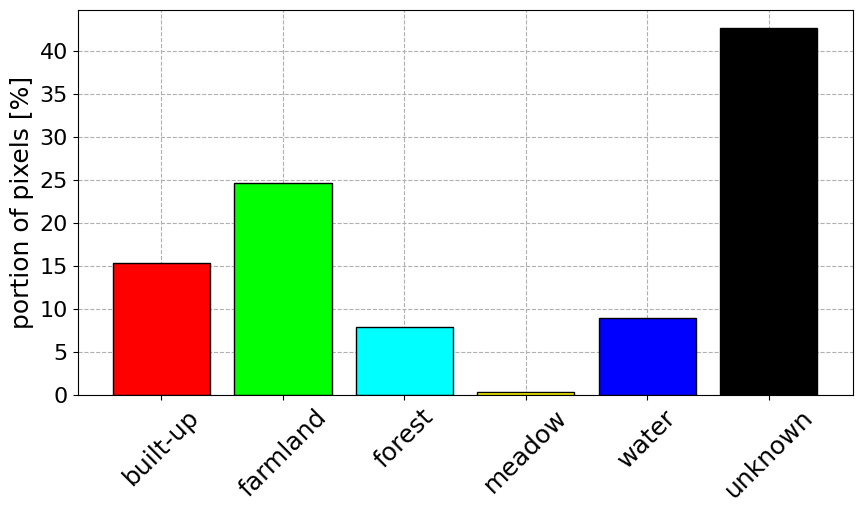

In [55]:
fig = plt.subplots(figsize = (10,5))

plt.bar([s.split("_")[0] for s in class_names], distr*100,
        color = np.array(class_rgb_values)/255,
        path_effects = ([pe.Stroke(linewidth = 1, foreground = "black")]),
        zorder = 2)

plt.grid(ls = "--", zorder = 1)

plt.ylabel("portion of pixels [%]", fontsize = 18)
plt.xticks(fontsize = 18, rotation = 45)
plt.yticks(fontsize = 16)

plt.savefig("./images/portion_of_pixels.png", dpi = 300, bbox_inches = "tight")

plt.show()

In [56]:
import numpy as np

# pixels adalah numpy array yang sama seperti sebelumnya,
# dengan asumsi sudah diisi dengan jumlah piksel per kelas untuk setiap gambar

# Hitung freq untuk setiap kelas
# Jumlah piksel per kelas di semua gambar
total_pixels_per_class = pixels.sum(axis=0)

# Jumlah gambar di mana setiap kelas muncul
images_per_class = np.count_nonzero(pixels, axis=0)

# Hindari pembagian dengan nol
images_per_class[images_per_class == 0] = 1

# Hitung freq
freq = total_pixels_per_class / (images_per_class * 224 * 224)

# Lakukan median frequency balancing
class_weight = np.median(freq) / freq

print("Frequency:", freq)
print("Class Weights for Median Frequency Balancing:", class_weight)


Frequency: [0.2600504  0.58921079 0.40939822 0.20978615 0.30319296 0.57770802
 0.        ]
Class Weights for Median Frequency Balancing: [1.16590078 0.5145747  0.74058203 1.44524779 1.         0.52482042
        inf]


C:\Users\oswal\AppData\Local\Temp\ipykernel_19144\3023971133.py:20: RuntimeWarning: divide by zero encountered in divide
  class_weight = np.median(freq) / freq


In [57]:
"""
freq[c]: total number of pixels of class c (over all images)
         divided by the total number of pixels of images where c is present
"""

#freq = pixels.sum(axis = 0)/(np.count_nonzero(pixels, axis = 0)*224**2)
#freq = np.array([0.3003414, 0.83421474, 0.39423746, 0.80435602, 0.36748701, 0.59869351])
freq = np.array([0.0757627,  0.17592091, 0.14037354, 0.09166584, 0.11655247, 0.15945812])
# median frequency balancing
class_weight = np.median(freq)/freq

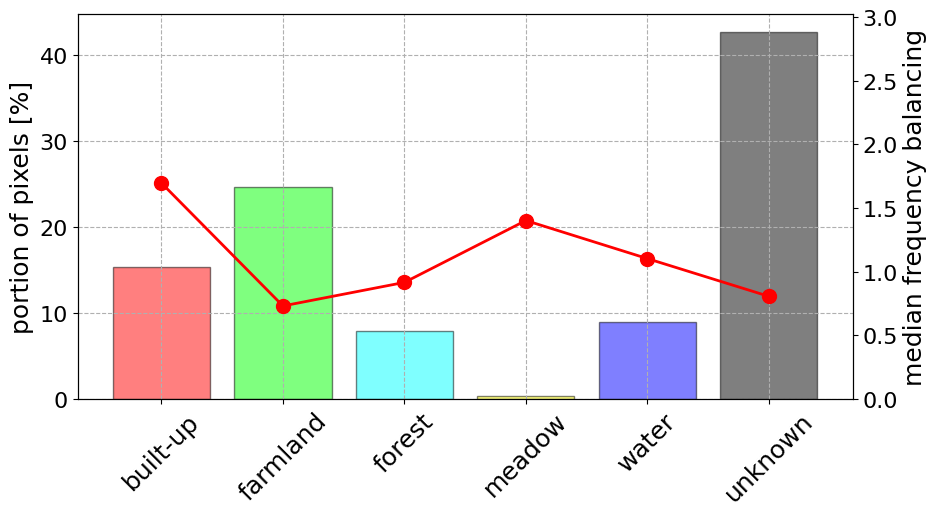

In [58]:
fig, axes1 = plt.subplots(figsize = (10,5))

axes1.grid(ls = "--")

# class distribution
axes1.bar([s.split("_")[0] for s in class_names], distr*100,
          color = np.array(class_rgb_values)/255, alpha = 0.5,
          path_effects = ([pe.Stroke(linewidth = 1, foreground = "black")]))

axes1.xaxis.set_tick_params(labelsize = 18, rotation = 45)
axes1.yaxis.set_tick_params(labelsize = 16)
axes1.set_ylabel("portion of pixels [%]", fontsize = 18)

# median frequency balancing
axes2 = axes1.twinx()
axes2.plot([s.split("_")[0] for s in class_names], class_weight,
           linestyle = "-", linewidth = 2, marker = "o", markersize = 10, color = "red")
axes2.set_ylim(bottom = 0, top = 3.025) #max(class_weight[:]*1.1))
axes2.xaxis.set_tick_params(labelsize = 18, rotation = 45)
axes2.yaxis.set_tick_params(labelsize = 16)
axes2.set_ylabel("median frequency balancing", fontsize = 18)

plt.savefig("./images/median_frequency_balancing.png", dpi = 300, bbox_inches = "tight")

plt.show()

# Data normalization


In [59]:
NORM = False

In [60]:
def task_mean(image_path):
    # numpy array (H,W,C)
    image = cv2.imread(image_path)
    # compute mean for each channel
    mean = np.sum(image, axis = (0,1))/(image.shape[0]**2)
    return mean

if NORM:
    train_means = []
    for img_path in tqdm(train_df["sat_image_path"].tolist()):
        train_means.append(task_mean(img_path))


In [61]:
#train_mean = np.array(train_means).mean(axis = 0)
train_mean = np.array([ 79.7510382, 112.14159978, 110.33270898])
print(train_mean)

[ 79.7510382  112.14159978 110.33270898]


In [62]:
def task_var(image_path):
    # numpy array (H,W,C)
    image = cv2.imread(image_path)
    # compute unbiased variance for each channel using global mean
    var = np.sum((image - train_mean)**2, axis = (0,1))/(image.shape[0]**2 - 1)
    return var

#if NORM:
    #train_vars = process_map(task_var, train_df["sat_image_path"].tolist(), max_workers = os.cpu_count(), chunksize = 1)

if NORM:
    train_vars = []
    for img_path in tqdm(train_df["sat_image_path"].tolist()):
        train_vars.append(task_var(img_path))


In [63]:
#train_var = np.array(train_vars).mean(axis = 0)
#train_std = np.sqrt(train_var)
train_std = np.array([79.7510382, 112.14159978, 110.33270898])
print(train_std)

[ 79.7510382  112.14159978 110.33270898]


# Define transformations for pre-processing and data augmentation

In [64]:
train_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # apply dihedral group D4
    album.RandomRotate90(p=1), # randomly rotates by 0, 90, 180, 270 degrees
    album.HorizontalFlip(p=0.5),
    album.VerticalFlip(p=0.5),
    album.Transpose(p=0.5),
    # change brightness, contrast, and saturation
    album.ColorJitter(p=0.5),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

In [65]:
valid_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

In [66]:
test_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

# Create a custom dataset class

In [67]:
class DeepGlobeLandCover(Dataset):

    def __init__(self, df, class_rgb_values = None, transform = None):

        # store image and mask paths
        self.image_paths = df["sat_image_path"].tolist()
        self.mask_paths = df["mask_path"].tolist()

        self.class_rgb_values = class_rgb_values
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, i):
        
        # read image and mask into a numpy array (they are already stored as BGR)
        image = cv2.imread(self.image_paths[i])
        mask = cv2.imread(self.mask_paths[i])

        # apply transformations
        if self.transform:
            sample = self.transform(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]

        # apply dense encoding
        mask = rgb_to_dense_encoding(mask, self.class_rgb_values)

        # transform from numpy array (H,W,C) to torch tensor (C,H,W)
        image = torch.from_numpy(image).permute(2, 0, 1)
        mask = torch.from_numpy(mask)#.long()

        return image, mask

# Create train, valid and test datasets

In [68]:
# get size of an image and a mask from the train dataset (without transformations)
idx = 1
get_size(*DeepGlobeLandCover(train_df, class_rgb_values)[idx])

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [3, 256, 256]      torch.uint8      0.2           
mask       <class 'torch.Tensor'>     [256, 256]         torch.uint8      0.07          


C:\Users\oswal\AppData\Local\Temp\ipykernel_19144\1496384942.py:19: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  image_size = sys.getsizeof(image.storage())/10**6


In [69]:
train_dataset = DeepGlobeLandCover(train_df, class_rgb_values, train_transform)
valid_dataset = DeepGlobeLandCover(valid_df, class_rgb_values, valid_transform)
test_dataset = DeepGlobeLandCover(test_df, class_rgb_values, test_transform)

In [70]:
# get size of an image and a mask from the train dataset (with transformations)
idx = 1
get_size(*train_dataset[idx])

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [3, 256, 256]      torch.float32    0.79          
mask       <class 'torch.Tensor'>     [256, 256]         torch.uint8      0.07          


# Create iterators over datasets

In [71]:
BATCH_SIZE = 32

# create iterators
train_iterator = DataLoader(train_dataset, shuffle = True, batch_size = BATCH_SIZE, drop_last = True)
valid_iterator = DataLoader(valid_dataset, batch_size = BATCH_SIZE, drop_last = True)
test_iterator = DataLoader(test_dataset, batch_size = BATCH_SIZE, drop_last = True)

In [72]:
# get size of an image and a mask from the train iterator (with transformations)
batch = next(iter(train_iterator))
get_size(*batch)

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [32, 3, 256, 256]  torch.float32    25.17         
mask       <class 'torch.Tensor'>     [32, 256, 256]     torch.uint8      2.1           


# Define functions for training phase


In [73]:
def compute_CM_elements(y_logits, y):

    """
    Input
    ----------------------------------------------------
    y_logits: [BATCH_SIZE, N_CLASSES, HEIGHT, WIDTH]
    y:        [BATCH_SIZE, HEIGHT, WIDTH] (dense encoding)
    ----------------------------------------------------

    Temporary
    ------------------------------------------------------------------------
    y_prob:      [BATCH_SIZE, N_CLASSES, HEIGHT, WIDTH]
    y_pred:      [BATCH_SIZE, HEIGHT, WIDTH]
    y_pred_bool: [BATCH_SIZE, HEIGHT, WIDTH, N_CLASSES] (one-hot encoding)
    y_bool:      [BATCH_SIZE, HEIGHT, WIDTH, N_CLASSES] (one-hot encoding)
    ------------------------------------------------------------------------
    
    Output
    ---------------
    TP: [N_CLASSES]
    FP: [N_CLASSES]
    TN: [N_CLASSES]
    FN: [N_CLASSES]
    ---------------
    """

    y_prob = F.softmax(y_logits, dim = 1)
    y_pred = y_prob.argmax(dim = 1)

    y_pred_bool = F.one_hot(y_pred, num_classes = 6).bool()#[..., :-1]
    y_bool = F.one_hot(y, num_classes = 6).bool()#[..., :-1]

    TP = torch.sum(torch.logical_and(y_pred_bool, y_bool), dim = (0,1,2))
    FP = torch.sum(y_pred_bool, dim = (0,1,2)) - TP
    TN = torch.sum(torch.logical_and(~y_pred_bool, ~y_bool), dim = (0,1,2))
    FN = torch.sum(~y_pred_bool, dim = (0,1,2)) - TN
    
    return TP, FP, TN, FN

In [74]:
def compute_metrics(loss, TP, FP, TN, FN):
    
    # loss
    loss = loss
    
    # IoU and macro-averaging IoU
    IoU = TP/(TP + FP + FN)
    MA_IoU = torch.sum(IoU)/6
    
    # accuracy and macro-averaging accuracy
    accuracy = (TP + TN)/(TP + FP + TN + FN)
    MA_accuracy = torch.sum(accuracy)/6
    
    # precision and macro-averaging precision
    precision = TP/(TP + FP)
    MA_precision = torch.sum(precision)/6
    
    # recall and macro-averaging recall
    recall = TP/(TP + FN)
    MA_recall = torch.sum(recall)/6
    
    # F1-score and macro-averaging F1-score
    F1_score = 2*(precision*recall)/(precision + recall)
    MA_F1_score = 2*(MA_precision*MA_recall)/(MA_precision + MA_recall)

    metrics = {
        "loss": loss.item(),
        "IoU": IoU.tolist(),
        "MA_IoU": MA_IoU.item(),
        "accuracy": accuracy.tolist(),
        "MA_accuracy": MA_accuracy.item(),
        "precision": precision.tolist(),
        "MA_precision": MA_precision.item(),
        "recall": recall.tolist(),
        "MA_recall": MA_recall.item(),
        "F1_score": F1_score.tolist(),
        "MA_F1_score": MA_F1_score.item()
    }
    
    return metrics

In [75]:
def train(model, iterator, criterion, optimizer, device, desc = "Train"):

    epoch_loss = 0

    epoch_TP = 0
    epoch_FP = 0
    epoch_TN = 0
    epoch_FN = 0

    # set train mode
    model.train()

    # loop over batches
    for x, y in tqdm(iterator, desc = desc): 

        # set gradients to zero
        optimizer.zero_grad()

        # move data to the GPU
        x = x.to(device)
        y = y.to(device)

        # make predictions
        y_logits = model(x)

        # compute loss
        loss = criterion(y_logits, y.long())

        # compute confusion matrix elements
        TP, FP, TN, FN = compute_CM_elements(y_logits, y.long())

        # compute gradients
        loss.backward()

        # update the weights according to the optimizer using the gradients
        optimizer.step()

        # update loss 
        epoch_loss += loss/len(iterator)

        # update confusion matrix elements
        epoch_TP += TP
        epoch_FP += FP
        epoch_TN += TN
        epoch_FN += FN

    epoch_metrics = compute_metrics(epoch_loss, epoch_TP, epoch_FP, epoch_TN, epoch_FN)
    
    return epoch_metrics

In [76]:
def evaluate(model, iterator, criterion, device, desc = "Valid"):

    epoch_loss = 0

    epoch_TP = 0
    epoch_FP = 0
    epoch_TN = 0
    epoch_FN = 0

    # set evaluation mode
    model.eval()

    # disable gradient tracking
    with torch.no_grad():

        # loop over batches
        for x, y in tqdm(iterator, desc = desc):

            # move data to the GPU
            x = x.to(device)
            y = y.to(device)

            # make predictions
            y_logits = model(x)

            # compute loss
            loss = criterion(y_logits, y.long())
            
            # compute confusion matrix elements
            TP, FP, TN, FN = compute_CM_elements(y_logits, y.long())

            # update loss 
            epoch_loss += loss/len(iterator)

            # update confusion matrix elements
            epoch_TP += TP
            epoch_FP += FP
            epoch_TN += TN
            epoch_FN += FN

    epoch_metrics = compute_metrics(epoch_loss, epoch_TP, epoch_FP, epoch_TN, epoch_FN)

    return epoch_metrics

In [77]:
def model_training(n_epochs, model, train_iterator, valid_iterator, criterion, optimizer, scheduler, device,
                   checkpoint_name = "checkpoint.pt", results_name = "results.csv"):

    # initialize validation loss
    best_valid_loss = float('inf')

    train_metrics_log = {}
    valid_metrics_log = {}

    print("----------------------------------------------------------")

    # loop over epochs
    for epoch in range(n_epochs):

        print(f"\nEpoch: {epoch + 1}/{n_epochs}\n")

        start_time = time.time()

        # training
        train_metrics = train(model, train_iterator, criterion, optimizer, device, desc = "Train")

        # validation
        valid_metrics = evaluate(model, valid_iterator, criterion, device,desc = "Valid")

        print(f"\nTrain:", \
              f"Loss = {train_metrics['loss']:.4f},", \
              f"MA_IoU = {train_metrics['MA_IoU']*100:.2f} %,", \
              f"MA_acc = {train_metrics['MA_accuracy']*100:.2f} %,", \
              f"MA_prec = {train_metrics['MA_precision']*100:.2f} %,", \
              f"MA_rec = {train_metrics['MA_recall']*100:.2f} %,", \
              f"MA_F1_score = {train_metrics['MA_F1_score']*100:.2f} %")
        
        print(f"Valid:", \
              f"Loss = {valid_metrics['loss']:.4f},", \
              f"MA_IoU = {valid_metrics['MA_IoU']*100:.2f} %,", \
              f"MA_acc = {valid_metrics['MA_accuracy']*100:.2f} %,", \
              f"MA_prec = {valid_metrics['MA_precision']*100:.2f} %,", \
              f"MA_rec = {valid_metrics['MA_recall']*100:.2f} %,", \
              f"MA_F1_score = {valid_metrics['MA_F1_score']*100:.2f} %")

        # scheduler
        if scheduler:
            scheduler.step()

        end_time = time.time()

        print(f"\nEpoch Time: {end_time-start_time:.2f} s\n")
        print("----------------------------------------------------------")
        
        # model checkpoint
        if valid_metrics["loss"] < best_valid_loss:
            best_valid_loss = valid_metrics["loss"]
            torch.save({
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "criterion_state_dict": criterion.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict() if bool(scheduler) else None,
            }, os.path.join('./checkpoints', checkpoint_name))
        
        # save train metrics
        for key in train_metrics.keys():
            if key not in train_metrics_log:
                train_metrics_log[key] = []
            train_metrics_log[key].append(train_metrics[key])
            
        pd.DataFrame.from_dict(train_metrics_log).to_csv("./results/train_" + results_name, index = False)
        
        # save valid metrics
        for key in valid_metrics.keys():
            if key not in valid_metrics_log:
                valid_metrics_log[key] = []
            valid_metrics_log[key].append(valid_metrics[key])
            
        pd.DataFrame.from_dict(valid_metrics_log).to_csv("./results/valid_" + results_name, index = False)

    return train_metrics_log, valid_metrics_log

# Define functions to plot results

In [78]:
def plot_results(checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name))["epoch"]
        train_results_df = pd.read_csv("./results/train_" + results_name).iloc[:best_epoch]
        valid_results_df = pd.read_csv("./results/valid_" + results_name).iloc[:best_epoch]
    else:
        train_frames = []
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name[i]))["epoch"]
            train_frames.append(pd.read_csv("./results/train_" + results_name[i]).iloc[:best_epoch])
            valid_frames.append(pd.read_csv("./results/valid_" + results_name[i]).iloc[:best_epoch]) 
        train_results_df = pd.concat(train_frames, ignore_index = True)
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
    
    assert len(train_results_df) == len(valid_results_df)
    n_epochs = len(train_results_df)
    
    plt.figure(figsize = (21, 14))
    
    n_rows = 3
    n_cols = 3
    idx = 1
    
    y_ranges = [(0.4, 1.1), (0.25, 0.65), (0.4, 0.8)]
    
    for i, metric in enumerate(["loss", "MA_IoU", "MA_F1_score", "MA_precision", "MA_recall", "MA_accuracy"]):
    
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        plt.plot(np.arange(n_epochs) + 1, train_results_df[metric], linewidth = 3, color = "tab:blue", label = "Train")
        plt.plot(np.arange(n_epochs) + 1, valid_results_df[metric], linewidth = 3, color = "tab:orange", label = "Valid")
        if i < 3:
            plt.ylim(bottom = y_ranges[i][0], top = y_ranges[i][1])
        plt.xlabel("epoch", fontsize = 14), plt.ylabel(metric, fontsize = 14)
        plt.xticks(fontsize = 12), plt.yticks(fontsize = 12)
        plt.legend(fontsize = 12)
        plt.grid()
        
    #plt.savefig("./images/results_UNet.png", dpi = 300)
    plt.show()

In [79]:
def plot_results_per_class(class_names, class_rgb_values, checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name))["epoch"]
        train_results_df = pd.read_csv("./results/train_" + results_name).iloc[:best_epoch]
        valid_results_df = pd.read_csv("./results/valid_" + results_name).iloc[:best_epoch]
    else:
        train_frames = []
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name[i]))["epoch"]
            train_frames.append(pd.read_csv("./results/train_" + results_name[i]).iloc[:best_epoch])
            valid_frames.append(pd.read_csv("./results/valid_" + results_name[i]).iloc[:best_epoch]) 
        train_results_df = pd.concat(train_frames, ignore_index = True)
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
            
    assert len(train_results_df) == len(valid_results_df)
    n_epochs = len(train_results_df)
    n_classes = len(class_names)
    plt.figure(figsize = (18, 30))
    n_rows = 5
    n_cols = 2
    idx = 1
      
    for metric in ["IoU", "accuracy", "precision", "recall", "F1_score"]:
        
        train_metric = np.zeros((n_epochs, n_classes))
        valid_metric = np.zeros((n_epochs, n_classes))

        for i in range(n_epochs):
            train_metric[i] = np.array(json.loads(train_results_df[metric].iloc[i].replace("nan", "NaN")))
            valid_metric[i] = np.array(json.loads(valid_results_df[metric].iloc[i].replace("nan", "NaN")))
 
        # train
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        for j in range(n_classes): 
            plt.plot(np.arange(n_epochs) + 1, train_metric[:,j], linewidth = 3, color = np.array(class_rgb_values[j])/255, label = class_names[j],
                path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        plt.xlabel("epoch", fontsize = 14)
        plt.ylabel(metric + " [Train]", fontsize = 14)
        plt.xticks(fontsize = 12)
        plt.yticks(fontsize = 12)
        plt.subplots_adjust(right = 0.8)
        plt.grid()

        # valid
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        for j in range(n_classes): 
            plt.plot(np.arange(n_epochs) + 1, valid_metric[:,j], linewidth = 3, color = np.array(class_rgb_values[j])/255, label = class_names[j],
                path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        plt.xlabel("Epoch", fontsize = 14)
        plt.ylabel(metric + " [Valid]", fontsize = 14)
        plt.xticks(fontsize = 12)
        plt.yticks(fontsize = 12)
        plt.subplots_adjust(right = 0.8)
        plt.grid()
        
        plt.legend(bbox_to_anchor = (1.1, 0.5), loc = "center left", borderaxespad = 0, fontsize = 12)
    
    plt.savefig("./results_per_class.png")
    plt.show()

# Define functions for testing phase

In [80]:
def test(model, iterator, criterion, device, desc = "Test"):

    loss = 0
    CM = 0

    # set evaluation mode
    model.eval()

    # disable gradient tracking
    with torch.no_grad():

        # loop over batches
        for x, y in tqdm(iterator, desc = desc):
            
            # move data to the GPU
            x = x.to(device)
            y = y.to(device)

            # make predictions
            y_logits = model(x)

            # compute loss
            loss = criterion(y_logits, y.long())
            
            # get one hot prediction
            y_prob = F.softmax(y_logits, dim = 1)
            y_pred = y_prob.argmax(dim = 1)
            
            # update loss
            loss += loss/len(iterator)
            
            # update confusion matrix (CPU)
            CM += confusion_matrix(y.view(-1).tolist(), y_pred.view(-1).tolist(), labels = range(6))

    # move loss from GPU to CPU
    loss = loss.cpu()
    
    # compute TP, FP, TN, FN
    TP = CM.diagonal().copy()
    CM_no_diag = CM - np.diag(TP)
    FP = CM_no_diag.sum(axis = 0)
    FN = CM_no_diag.sum(axis = 1)
    TN = CM.sum() - (FP + FN + TP)
    
    # transfrom from numpy to tensor (CPU)
    TP = torch.from_numpy(TP)
    FP = torch.from_numpy(FP)
    TN = torch.from_numpy(TN)
    FN = torch.from_numpy(FN)

    metrics = compute_metrics(loss, TP, FP, TN, FN)

    return metrics, CM

In [81]:
def model_testing(model, test_iterator, criterion, device,
                  checkpoint_name = "checkpoint.pt", results_name = "results.csv", CM_name = "confusion_matrix.csv"):
    
    # load checkpoint
    checkpoint = torch.load(os.path.join("./checkpoints", checkpoint_name))
    model.load_state_dict(checkpoint["model_state_dict"])
    criterion.load_state_dict(checkpoint["criterion_state_dict"])
    
    metrics_log = {}

    # testing
    metrics, CM = test(model, test_iterator, criterion, device, desc = "Test")
    
    # save metrics
    for key in metrics.keys():
        if key not in metrics_log:
            metrics_log[key] = []
        metrics_log[key].append(metrics[key])
        
    pd.DataFrame.from_dict(metrics_log).to_csv("./results/test_" + results_name, index = False)
    
    # save confusion matrix
    pd.DataFrame(CM).to_csv("./results/" + CM_name, index = False)

In [82]:
def plot_CM(class_names, CM_name = "confusion_matrix.csv"):
    
    CM = pd.read_csv("./results/" + CM_name).values
    CM = normalize(CM, axis = 1, norm = "l1")
    
    fig, ax = plt.subplots(figsize = (9,7))
    ax = sn.heatmap(CM,
                    xticklabels = [s.split("_")[0] for s in class_names],
                    yticklabels = [s.split("_")[0] for s in class_names],
                    vmin = 0, vmax = 1,
                    cmap = "Blues",
                    fmt = ".2f",
                    ax = ax,
                    annot_kws = {"fontsize": 16},
                    #linewidths = 1, linecolor = "black",
                    annot = True)

    ax.collections[0].colorbar.ax.tick_params(labelsize = 16)
    plt.xticks(fontsize = 18, rotation = 90)
    plt.yticks(fontsize = 18, rotation = 0)
    plt.tight_layout()
    
    plt.savefig("./images/CM_UNet.png", dpi = 300, bbox_inches = "tight")
    plt.show()

# Define the model: U-Net

In [83]:
class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace = True),
            nn.Conv2d(out_channels, out_channels, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace = True)
        )

    def forward(self, x):
        return self.block(x)


class DownBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.block(x)


class UpBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 2, stride = 2)
        self.double_conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        # upsampled convolution
        x1 = self.up_conv(x1)
        # concatenation
        x = torch.cat([x2, x1], dim = 1)
        # double convolution
        return self.double_conv(x)

In [84]:
class UNet(nn.Module):
    
    def __init__(self, n_classes = 6):
        super().__init__()
        # initial double convolution
        self.double_conv = DoubleConv(3, 64)
        # downsampling path
        self.down_block_1 = DownBlock(64, 128)
        self.down_block_2 = DownBlock(128, 256)
        self.down_block_3 = DownBlock(256, 512)
        self.down_block_4 = DownBlock(512, 1024)
        # upsampling path (with skip-connections)
        self.up_block_1 = UpBlock(1024, 512)
        self.up_block_2 = UpBlock(512, 256)
        self.up_block_3 = UpBlock(256, 128)
        self.up_block_4 = UpBlock(128, 64)
        # final convolution
        self.conv = nn.Conv2d(64, n_classes, kernel_size = 1)

    def forward(self, x):
        # initial double convolution
        x1 = self.double_conv(x)
        # downsampling path
        x2 = self.down_block_1(x1)
        x3 = self.down_block_2(x2)
        x4 = self.down_block_3(x3)
        x5 = self.down_block_4(x4)
        # upsampling path (with skip-connections)
        x = self.up_block_1(x5, x4)
        x = self.up_block_2(x, x3)
        x = self.up_block_3(x, x2)
        x = self.up_block_4(x, x1)
        # final convolution
        return self.conv(x)

# Training

## Train model

In [85]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

1 NVIDIA GeForce RTX 3050 Laptop GPU GPU available


In [86]:
model = UNet()
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight = torch.from_numpy(class_weight).float())
criterion = criterion.to(device)

optimizer = optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

scheduler = None

N_EPOCHS = 5

In [87]:
TRAIN = False

if TRAIN:
    train_metrics_log, valid_metrics_log = model_training(N_EPOCHS,
                                                          model,
                                                          train_iterator,
                                                          valid_iterator,
                                                          criterion,
                                                          optimizer,
                                                          scheduler,
                                                          device,
                                                          "checkpoint.pt",
                                                          "results.csv")

## Plot results

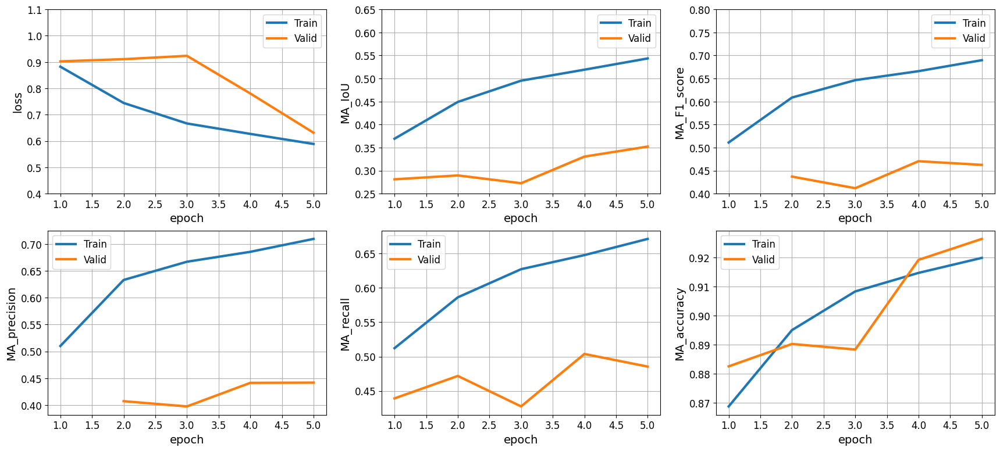

In [88]:
plot_results("checkpoint.pt", "results.csv")

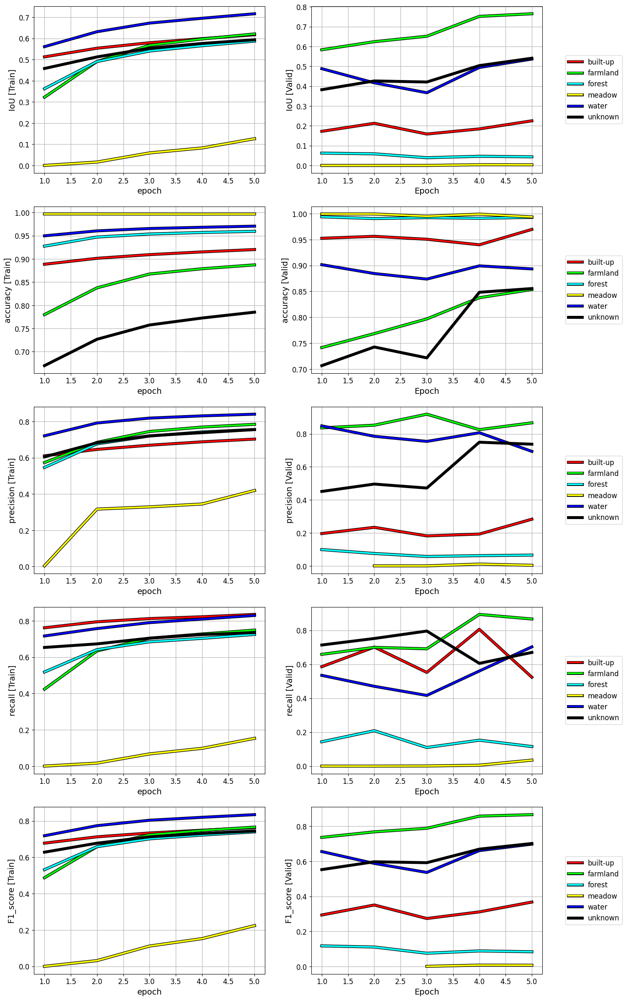

In [89]:
plot_results_per_class(class_names, class_rgb_values, "checkpoint.pt", "results.csv")

## Test model

In [90]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

1 NVIDIA GeForce RTX 3050 Laptop GPU GPU available


In [91]:
TEST = False

if TEST:
    model_testing(model,
                  test_iterator,
                  criterion,
                  device,
                  "checkpoint.pt",
                  "results.csv",
                  "confusion_matrix.csv")

In [92]:
pd.read_csv("./results/test_results.csv").iloc[:,np.arange(0, 12, 2)].style.hide()

loss,MA_IoU,MA_accuracy,MA_precision,MA_recall,MA_F1_score
0.602179,nan,1.077458,nan,nan,nan


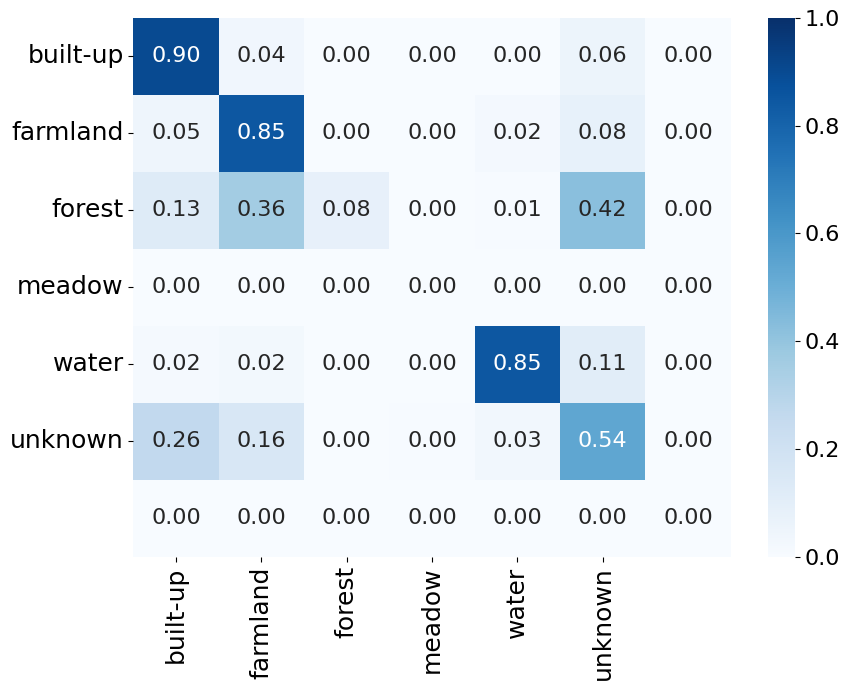

In [93]:
plot_CM(class_names, "confusion_matrix.csv")

# Resume training

## Train model

In [94]:
def load_checkpoint(model, criterion, optimizer, scheduler, checkpoint_name = "checkpoint.pt"):
    
    checkpoint = torch.load(os.path.join("./checkpoints", checkpoint_name))
    model.load_state_dict(checkpoint["model_state_dict"])
    criterion.load_state_dict(checkpoint["criterion_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    if bool(checkpoint["scheduler_state_dict"]):
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
        
    return model, criterion, optimizer, scheduler

In [95]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

1 NVIDIA GeForce RTX 3050 Laptop GPU GPU available


In [96]:
model = UNet()
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight = torch.from_numpy(class_weight).float())
criterion = criterion.to(device)

optimizer = optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

scheduler = None

N_EPOCHS = 10

# load checkpoint
model, criterion, optimizer, scheduler = load_checkpoint(model,
                                                         criterion,
                                                         optimizer,
                                                         scheduler,
                                                         checkpoint_name = "checkpoint.pt")

In [97]:
TRAIN = False

if TRAIN:
    train_metrics_log, valid_metrics_log = model_training(N_EPOCHS,
                                                          model,
                                                          train_iterator,
                                                          valid_iterator,
                                                          criterion,
                                                          optimizer,
                                                          scheduler,
                                                          device,
                                                          "checkpoint_1.pt",
                                                          "results_1.csv")

## Plot results

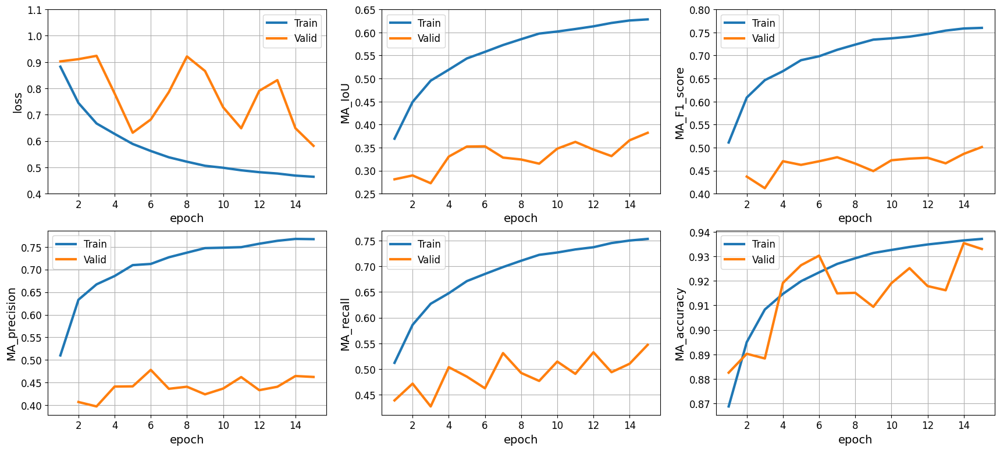

In [98]:
plot_results(["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

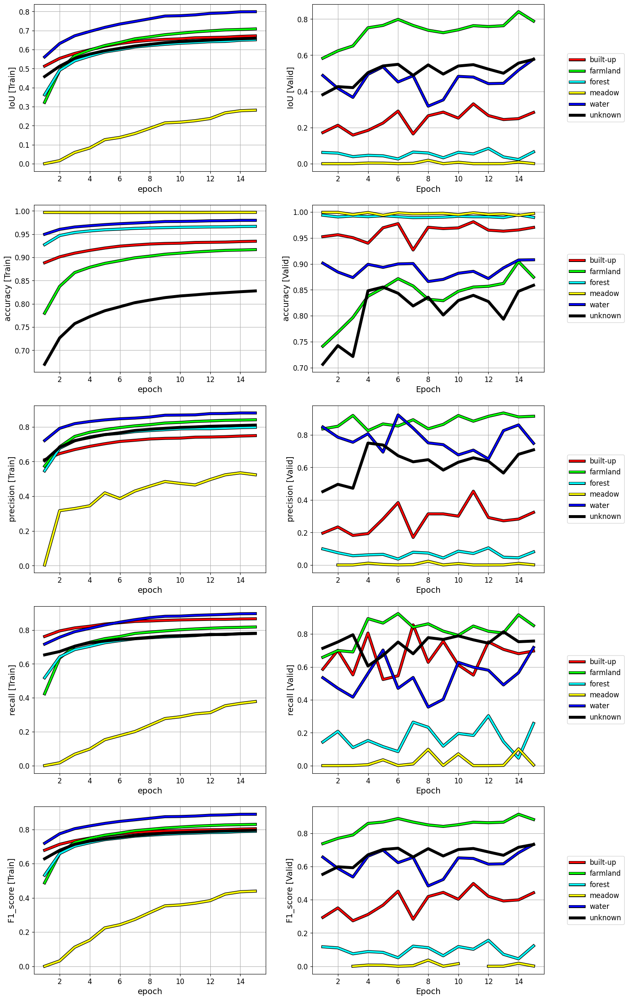

In [99]:
plot_results_per_class(class_names, class_rgb_values, ["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

In [100]:
def plot_results_per_class_report(class_names, class_rgb_values, checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name))["epoch"]
        valid_results_df = pd.read_csv("./results/valid_" + results_name).iloc[:best_epoch]
    else:
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(os.path.join("./checkpoints", checkpoint_name[i]))["epoch"]
            valid_frames.append(pd.read_csv("./results/valid_" + results_name[i]).iloc[:best_epoch]) 
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
            
    n_epochs = len(valid_results_df)
    n_classes = len(class_names) 
    valid_metric = np.zeros((n_epochs, n_classes))
    for i in range(n_epochs):
        valid_metric[i] = np.array(json.loads(valid_results_df["IoU"].iloc[i].replace("nan", "NaN")))
     
    plt.figure(figsize = (10, 7))   
    plt.subplot(1,1,1)
    
    for i in range(n_classes): 
        plt.plot(np.arange(n_epochs) + 1, valid_metric[:,i],
                 linewidth = 3,
                 color = np.array(class_rgb_values[i])/255,
                 label = [s.split("_")[0] for s in class_names][i],
                 path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        
    plt.plot(np.arange(n_epochs) + 1, np.mean(valid_metric[:,:-1], axis = 1),
             linewidth = 4,
             linestyle = "-",
             color = "red",
             label = "MIoU")
     
    plt.xlabel("epoch", fontsize = 18)
    plt.ylabel("IoU", fontsize = 18)
    plt.xticks(fontsize = 16)
    plt.yticks(np.arange(0, 1+0.2, 0.2), fontsize = 16)
    plt.grid(ls = "--")
    
    plt.legend(bbox_to_anchor=(0, 1.02, 1, 0.2),
               loc = "lower left",
               mode = "expand",
               borderaxespad = 0,
               ncol = 4,
               fontsize = 18)
    
    #plt.savefig("./images/IoU_per_class_UNet.png", dpi = 300, bbox_inches = "tight")
    plt.show()

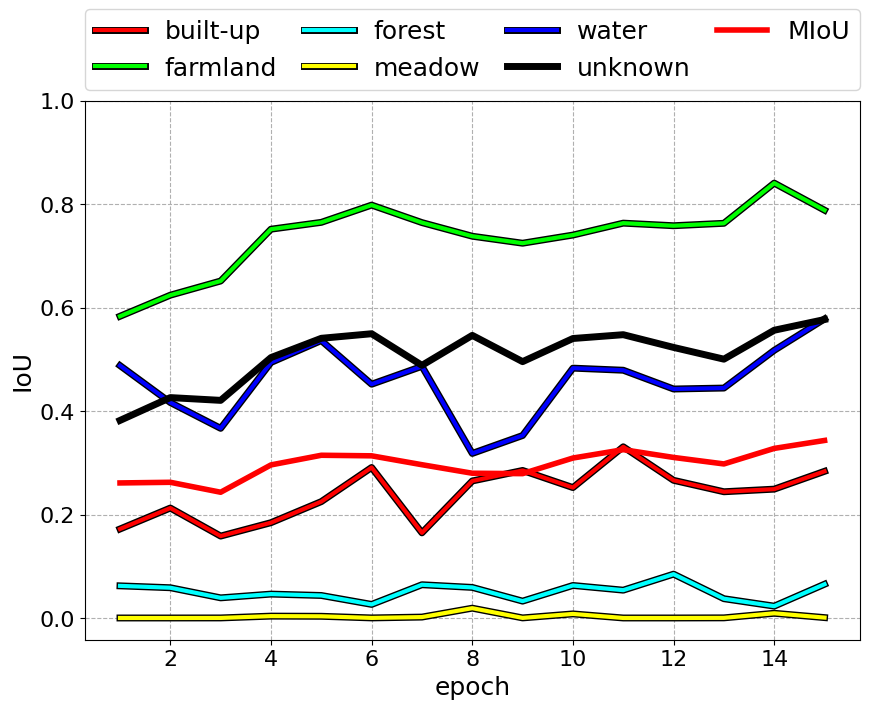

In [101]:
plot_results_per_class_report(class_names, class_rgb_values, ["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

## Test model

In [102]:
TEST = False

if TEST:
    model_testing(model,
                  test_iterator,
                  criterion,
                  device,
                  "checkpoint_1.pt",
                  "results_1.csv",
                  "confusion_matrix_1.csv")

In [103]:
pd.read_csv("./results/test_results_1.csv").iloc[:,np.arange(0, 12, 2)].style.hide()

loss,MA_IoU,MA_accuracy,MA_precision,MA_recall,MA_F1_score
0.532770,nan,1.100591,nan,nan,nan


In [104]:
for metric in ["IoU", "F1_score"]:
    arr = json.loads(pd.read_csv("./results/test_results_1.csv")[metric].iloc[-1].replace("nan", "NaN"))
    arr = np.array(arr)
    print(f"MA_{metric} (6 classes):", np.mean(arr[:-1]))

MA_IoU (6 classes): 0.4257841259241104
MA_F1_score (6 classes): nan


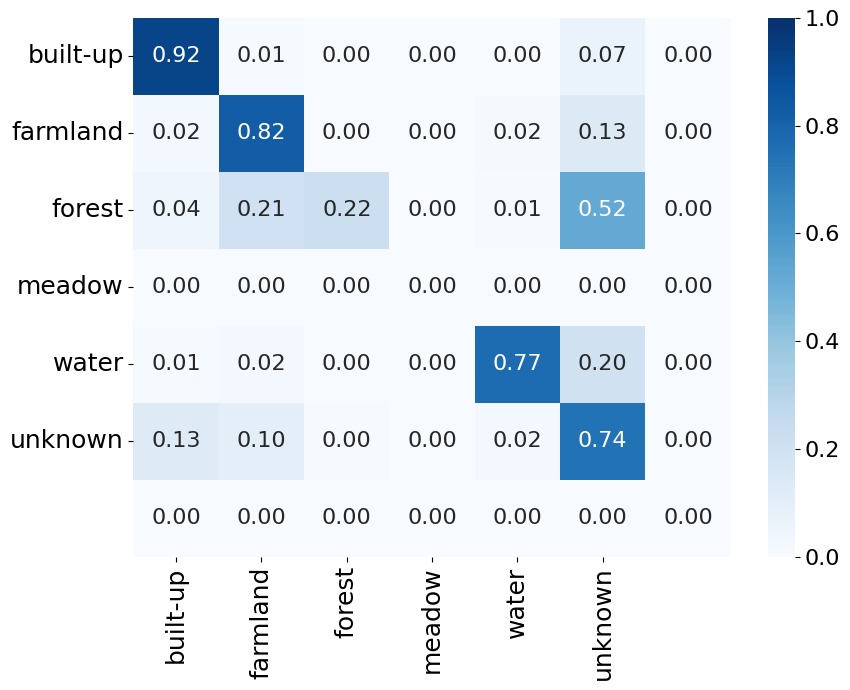

In [105]:
plot_CM(class_names, "confusion_matrix_1.csv")

# Predict

In [106]:
metadata_df = pd.read_csv(os.path.join(DATA_PATH, "metadata.csv"))

# select only images with masks
metadata_df = metadata_df[metadata_df["split"]=="train"]

# drop "split" column
metadata_df = metadata_df[["image_id", "sat_image_path", "mask_path"]]

# modify the path of images and masks
metadata_df["sat_image_path"] = metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
metadata_df["mask_path"] = metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

metadata_df.head()

,image_id,sat_image_path,mask_path
0,GF2_PMS1__L1A0001015649-MSS1,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...
1,GF2_PMS1__L1A0001094941-MSS1,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...
2,GF2_PMS1__L1A0000575925-MSS1,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...
3,GF2_PMS1__L1A0001344822-MSS1,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...
4,GF2_PMS1__L1A0000708367-MSS1,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...,C:\Users\oswal\Documents\Kuliah\Semester 7\Pra...


In [107]:
def predict_image(model, image, mask, CUT_IMAGE = True):
    
    # normalize
    image = (image - train_mean)/train_std

    # cut image in patches of 224 pixels, make the predictions, and put them together
    if CUT_IMAGE:
        
        patch_size = 256

        if(image.shape[0] != image.shape[1]): raise ValueError("Image should be squared")

        crop_size = patch_size*(image.shape[0]//patch_size)
        
        # central crop
        s = image.shape[1]/2 - crop_size/2
        crop_image = image[int(s):int(s+crop_size), int(s):int(s+crop_size), :]
        crop_mask = mask[int(s):int(s+crop_size), int(s):int(s+crop_size), :]

        model.to(device)

        # set evaluation mode
        model.eval()

        # disable gradient tracking
        torch.no_grad()
        
        predict_mask = np.zeros_like(crop_mask)

        for i in range(crop_image.shape[0]//patch_size):
            for j in range(crop_image.shape[0]//patch_size):

                patch = crop_image[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :]

                # transform from numpy array (H,W,C) to torch tensor (C,H,W)
                patch = torch.from_numpy(patch).permute(2, 0, 1).to(device)

                # add dummy dimension for batch
                patch = patch[None, :]

                logits_mask = model(patch.float()) # (1, C, H, W)
                prob_mask = F.softmax(logits_mask, dim=1) # (1, C, H, W)
                pred_mask = prob_mask.argmax(dim=1)[0] # (H, W)
                pred_mask_rgb = dense_to_rgb_encoding(pred_mask.cpu(), class_rgb_values) # (H, W, 3)
                
                # saving patches
                predict_mask[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :] = pred_mask_rgb
                        
    else:
        
        if image.shape[0]%16 != 0 : raise ValueError("Image shape should be a multiple of 16")
            
        model.to("cpu")
            
        # set evaluation mode
        model.eval()

        # disable gradient tracking
        torch.no_grad()

        # transform from numpy array (H,W,C) to torch tensor (C,H,W)
        sample = torch.from_numpy(image).permute(2, 0, 1)
        
        # add dummy dimension for batch
        sample = sample[None, :]

        logits_mask = model(sample.float()) # (1, C, H, W)
        prob_mask = F.softmax(logits_mask, dim=1) # (1, C, H, W)
        pred_mask = prob_mask.argmax(dim=1)[0] # (H, W)
        predict_mask = dense_to_rgb_encoding(pred_mask, class_rgb_values) # (H, W, 3)
    
    return predict_mask

In [108]:
def plot_prediction(model, image, mask, CUT_IMAGE = True):
    
    pred_mask = predict_image(model, image, mask, CUT_IMAGE = CUT_IMAGE)
    
    # crop to plot the same shape
    if mask.shape != pred_mask.shape:
        s = image.shape[1]/2 - pred_mask.shape[0]/2
        image = image[int(s):int(s+pred_mask.shape[0]), int(s):int(s+pred_mask.shape[0]), :]
        mask = mask[int(s):int(s+pred_mask.shape[0]), int(s):int(s+pred_mask.shape[0]), :]

    # plot image
    
    fig = plt.figure(figsize = (15, 5))
    fig.subplots_adjust(wspace = 0.02, hspace = 0.02)#, top = 0.8)
    
    idx = 1
    
    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(pred_mask)
    plt.title("Prediction", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(image)
    plt.title("Input image", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])

    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(mask)
    plt.title("Ground truth", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])
    
    plt.savefig("./images/UNet_pred_patches_2.png", dpi = 300, bbox_inches = "tight") if CUT_IMAGE else \
    plt.savefig("./images/UNet_pred_full_2.png", dpi = 300, bbox_inches = "tight")
    
    plt.show()

selected image id: GF2_PMS1__L1A0001015649-MSS1


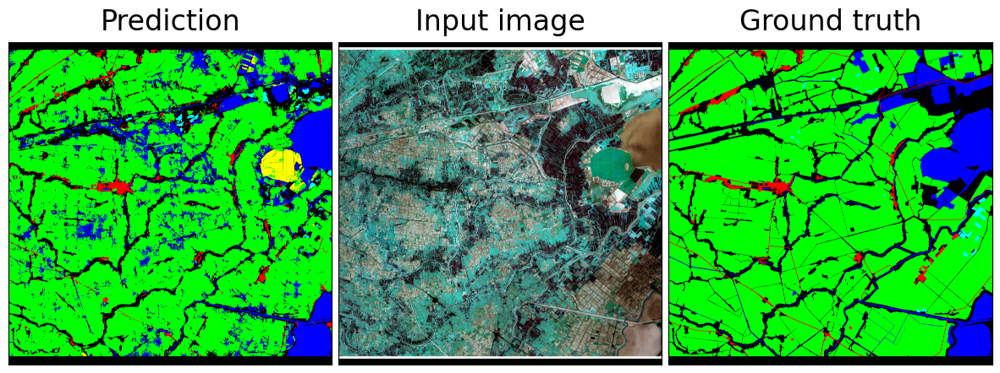

In [109]:
# [713813, 208495, 186739, 53987, 897901, 942986, 632489, 882451, 454655, 172307]
sample_image_id = 'GF2_PMS1__L1A0001015649-MSS1' #test_df["image_id"].sample(1, ignore_index = True).iloc[0]
print("selected image id:", sample_image_id)

sample_image_path = metadata_df[metadata_df["image_id"] == sample_image_id]["sat_image_path"].iloc[0]
sample_mask_path = metadata_df[metadata_df["image_id"] == sample_image_id]["mask_path"].iloc[0]

image = cv2.cvtColor(cv2.imread(sample_image_path),cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(sample_mask_path),cv2.COLOR_BGR2RGB)

plot_prediction(model, image, mask, CUT_IMAGE = True)

# Additional plots

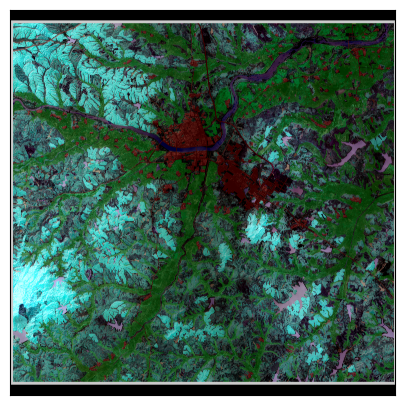

In [110]:
# get image and mask paths of a full image
idx = 2 #207 #296 #349 #382
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

# plot image
fig = plt.subplots(figsize = (10,5))

plt.subplot(1,1,1)
plt.imshow(mask, alpha = 1)
plt.imshow(image, alpha = 0.8)
plt.xticks([])
plt.yticks([])

#plt.savefig("./images/image_mask_superimposed.png", dpi = 300, bbox_inches = "tight")
plt.show()

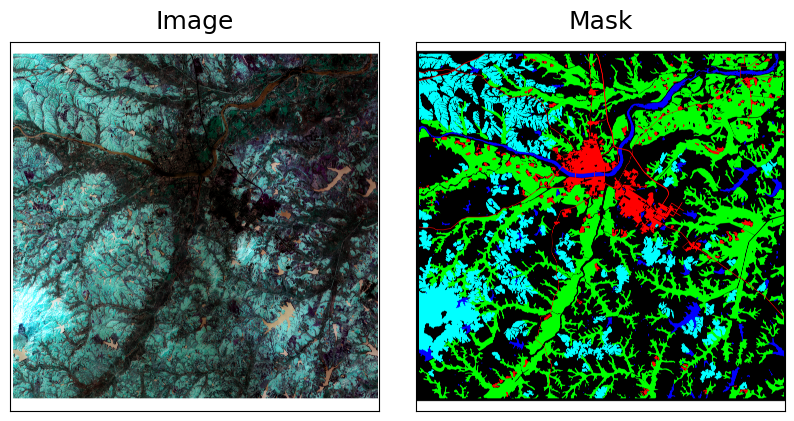

In [121]:
# get image and mask paths of a full image
idx = 2
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

# plot image
fig = plt.figure(figsize = (10,5))
fig.subplots_adjust(wspace = 0.1, hspace = 0.1)

plt.subplot(1,2,1)
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.title("Image", fontsize = 18, pad = 10)

plt.subplot(1,2,2)
plt.imshow(mask)
plt.xticks([])
plt.yticks([])
plt.title("Mask", fontsize = 18, pad = 10)

plt.savefig("./images/image_mask_separeted.png", dpi = 300, bbox_inches = "tight")
plt.show()

# from matplotlib.patches import Patch
# from matplotlib.colors import ListedColormap

# # Definisi kelas dan warna RGB dari mask
# class_dict = {
#     'built-up': (255, 0, 0),
#     'farmland': (0, 255, 0),
#     'forest': (0, 255, 255),
#     'meadow': (255, 255, 0),
#     'water': (0, 0, 255),
#     'unknown': (0, 0, 0)  # Anggap 'unknown' direpresentasikan dengan warna hitam
# }

# # Buat legenda
# legend_patches = [Patch(color=np.array(color)/255, label=name) for name, color in class_dict.items()]

# # Buat colormap khusus untuk mask
# cmap = ListedColormap(np.array(list(class_dict.values()))/255)

# # Ambil path gambar dan mask
# idx = 2
# image_path = metadata_df["sat_image_path"][idx]
# mask_path = metadata_df["mask_path"][idx]

# # Baca gambar dan mask dalam array numpy dan konversi dari BGR ke RGB
# image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
# mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

# # Konversi mask ke grayscale lalu ke indeks kelas
# mask_gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
# mask_index = np.zeros_like(mask_gray, dtype=int)  # Using Python's built-in int type
# for i, (name, color) in enumerate(class_dict.items()):
#     mask_index[(mask == color).all(axis=2)] = i


# # Plot gambar
# fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
# fig.subplots_adjust(wspace=0.1, hspace=0.1)

# ax[0].imshow(image)
# ax[0].set_title("Input Image", fontsize=18)

# # Menumpuk mask di atas gambar dengan opasitas (alpha) tertentu
# ax[1].imshow(image)
# ax[1].imshow(mask_index, cmap=cmap, alpha=0.5)  # Tumpuk mask dengan opasitas
# ax[1].set_title("Ground Truth Mask", fontsize=18)

# # Hilangkan sumbu koordinat
# for a in ax:
#     a.set_xticks([])
#     a.set_yticks([])

# # Tambahkan legenda ke plot kedua
# ax[1].legend(handles=legend_patches, loc='lower center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=len(class_dict))

# plt.tight_layout()
# plt.savefig("./images/image_mask_with_labels_overlay.png", dpi=300, bbox_inches="tight")
# plt.show()


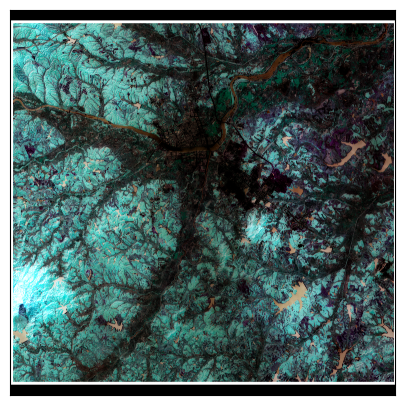

In [112]:
# get image and mask paths of a full image
idx = 2 #382 #282 #257 #349
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

# plot image
fig = plt.subplots(figsize = (10,5))

plt.subplot(1,1,1)
plt.imshow(image)
plt.xticks([])
plt.yticks([])

plt.savefig("./images/image_full.png", dpi = 300, bbox_inches = "tight")
plt.show()

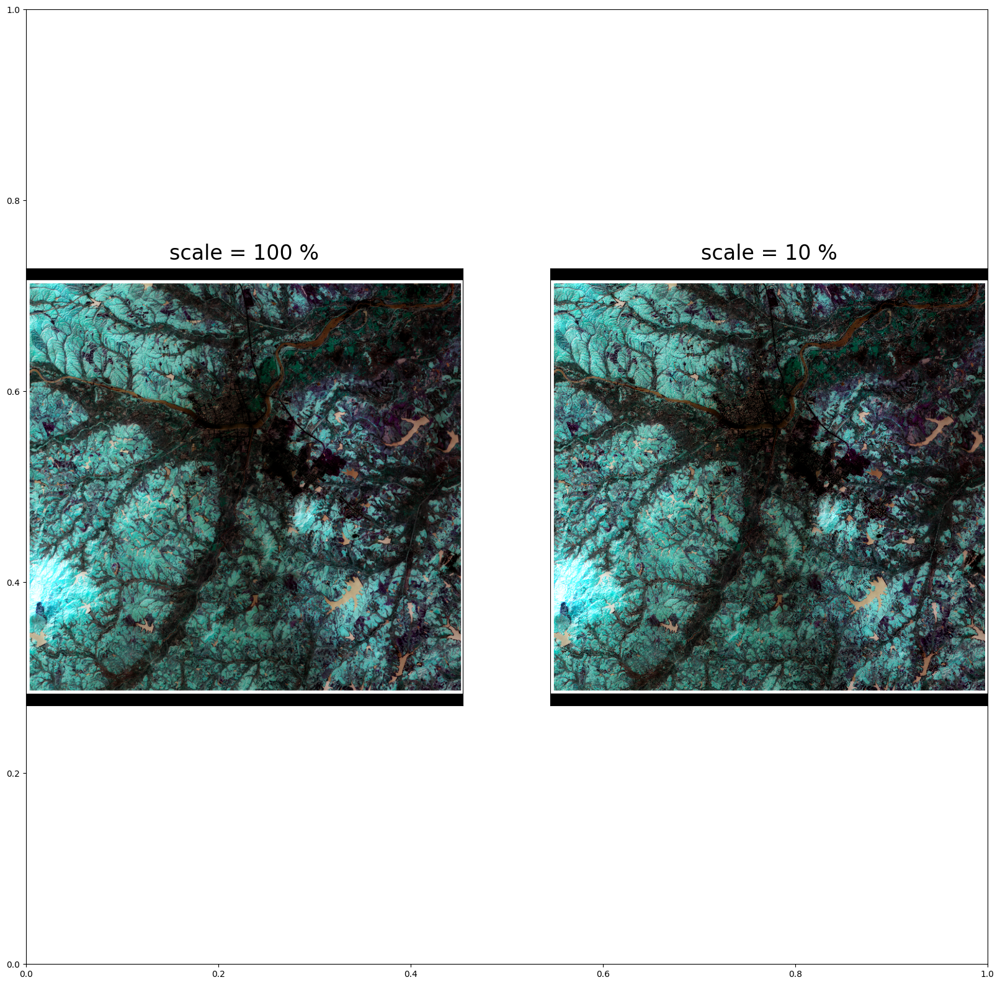

In [113]:
# get image and mask paths of a full image
idx = 2 #382 #282 #257 #349
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

# plot image
fig = plt.subplots(figsize = (20,20))

scale = [1, 0.1]

for i, s in enumerate(scale):

    # resize image and mask
    scaled_size = int(image.shape[0]*s)
    scaled_image = cv2.resize(image, (scaled_size, scaled_size))
    scaled_mask = cv2.resize(mask, (scaled_size, scaled_size))

    plt.subplot(1,2,i+1)
    plt.imshow(scaled_image)
    plt.title(f"scale = {int(s*100)} %", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])

plt.savefig("./images/image_rescaling.png", dpi = 300, bbox_inches = "tight")
plt.show()

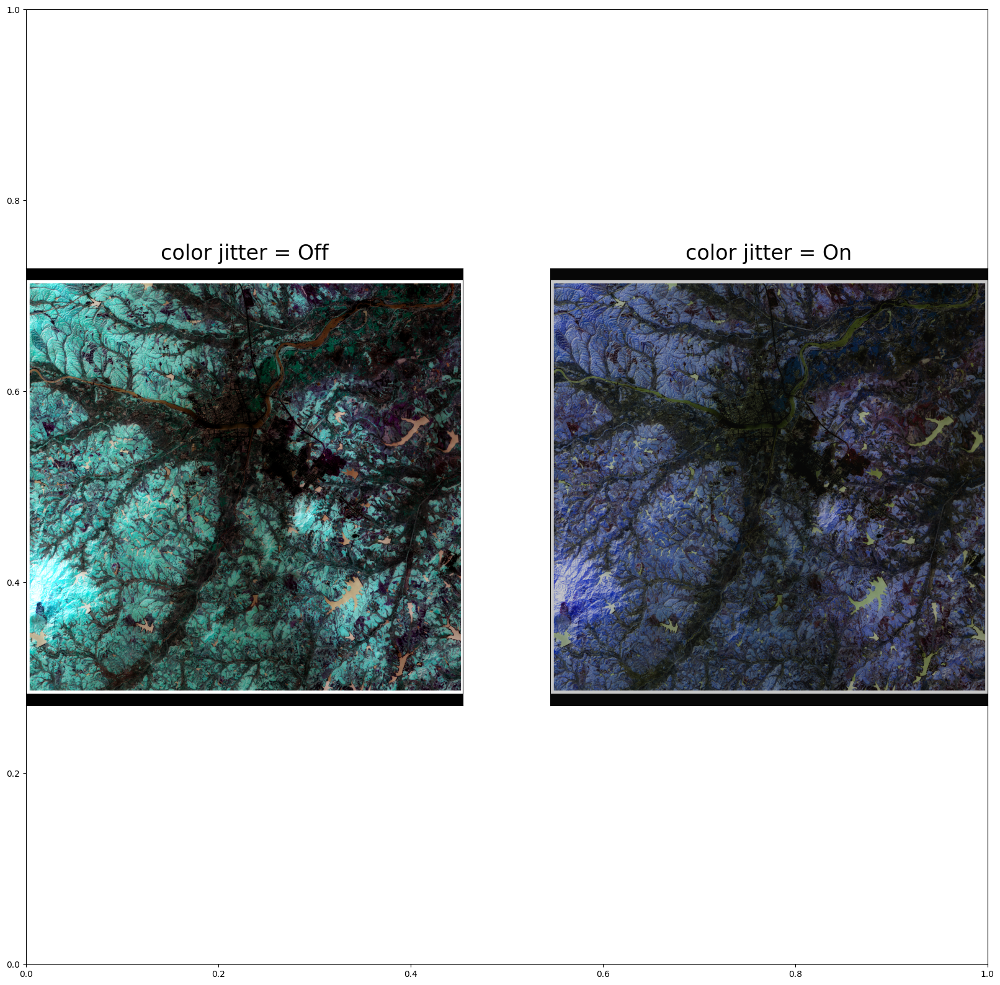

In [114]:
# get image and mask paths of a full image
idx = 2 #382 #282 #257 #349
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

aug = album.ColorJitter(p=1)
sample = aug(image = image, mask = mask)
#image, mask = sample["image"], sample["mask"]

# plot image
fig = plt.subplots(figsize = (20,20))

plt.subplot(1,2,1)
plt.imshow(image)
plt.title("color jitter = Off", fontsize = 24, pad = 10)
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(sample["image"])
plt.title("color jitter = On", fontsize = 24, pad = 10)
plt.xticks([])
plt.yticks([])

plt.savefig("./images/image_color_jitter.png", dpi = 300, bbox_inches = "tight")
plt.show()

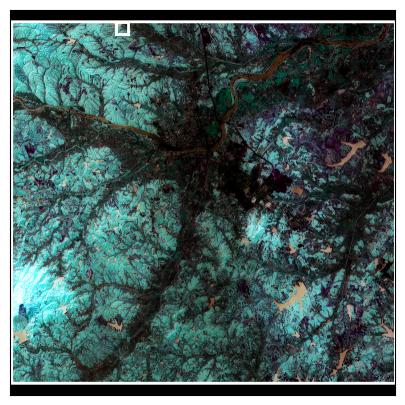

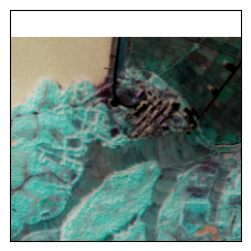

In [115]:
# get image and mask paths of a full image
idx = 2 #382 #282 #257 #349
image_path = metadata_df["sat_image_path"][idx]
mask_path = metadata_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

n_col = 9 #10-th
n_row = 1 #2-th

# plot image
fig = plt.subplots(figsize = (10,5))

plt.subplot(1,1,1)
plt.imshow(image)

# vertical lines
plt.plot([224*n_col,224*n_col], [224*n_row,224*(n_row+1)], color = "white", ls = "-", lw = 2)
plt.plot([224*(n_col+1),224*(n_col+1)], [224*n_row,224*(n_row+1)], color = "white", ls = "-", lw = 2)

# horizontal lines
plt.plot([224*n_col,224*(n_col+1)], [224*n_row,224*n_row], color = "white", ls = "-", lw = 2)
plt.plot([224*n_col,224*(n_col+1)], [224*(n_row+1),224*(n_row+1)], color = "white", ls = "-", lw = 2)

plt.xticks([])
plt.yticks([])

#plt.savefig("./images/image_random_patch.png", dpi = 300, bbox_inches = "tight")
plt.show()

# plot patch
fig = plt.subplots(figsize = (6,3))

patch = image[224*n_row:224*(n_row+1), 224*n_col:224*(n_col+1), :]
plt.subplot(1,1,1)
plt.imshow(patch)

plt.xticks([])
plt.yticks([])

plt.savefig("./images/patch_random_patch.png", dpi = 300, bbox_inches = "tight")
plt.show()

In [116]:
def plot_patches(index, scale = [1]):
    
    # patches settings
    original_size = 7300
    scale = scale
    patch_size = 224
    stride = 224

    patch_idx = {}
    for s in scale:
        patch_idx[s] =  [stride*i for i in range(int(int(original_size*s)/stride))]

    # get image and mask paths of a full image
    image_path = metadata_df["sat_image_path"][index]
    mask_path = metadata_df["mask_path"][index]

    # read image and mask into a numpy array and convert from BGR ot RGB
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

    if image.shape[0] != original_size:
        raise ValueError("The image size should be " + str(original_size))

    for s in scale:
        
        # resize image and mask
        scaled_size = int(image.shape[0]*s)
        scaled_image = cv2.resize(image, (scaled_size, scaled_size))
        scaled_mask = cv2.resize(mask, (scaled_size, scaled_size))

        if scaled_image.shape[0] < patch_idx[s][-1] + patch_size:
            raise ValueError("The scaled image should contain all the patches")
            
        fig = plt.figure(figsize = (10, 10))
        fig.subplots_adjust(wspace = 0.1, hspace = 0.1)
            
        n_rows = len(patch_idx[s])
        n_cols = n_rows
        idx = 1
        
        for i in patch_idx[s]:
            for j in patch_idx[s]:

                # get patches
                scaled_image_patch = scaled_image[i:i+patch_size, j:j+patch_size, :]
                scaled_mask_patch = scaled_mask[i:i+patch_size, j:j+patch_size, :]
                
                plt.subplot(n_rows,n_cols,idx)
                idx += 1
                #plt.imshow(scaled_mask_patch, alpha = 1)
                #plt.imshow(scaled_image_patch, alpha = 0.8)
                plt.imshow(scaled_image_patch)
                plt.xticks([])
                plt.yticks([])
                
        #plt.savefig("./images/image_patches.png", dpi = 300, bbox_inches = "tight")
        
        plt.show()

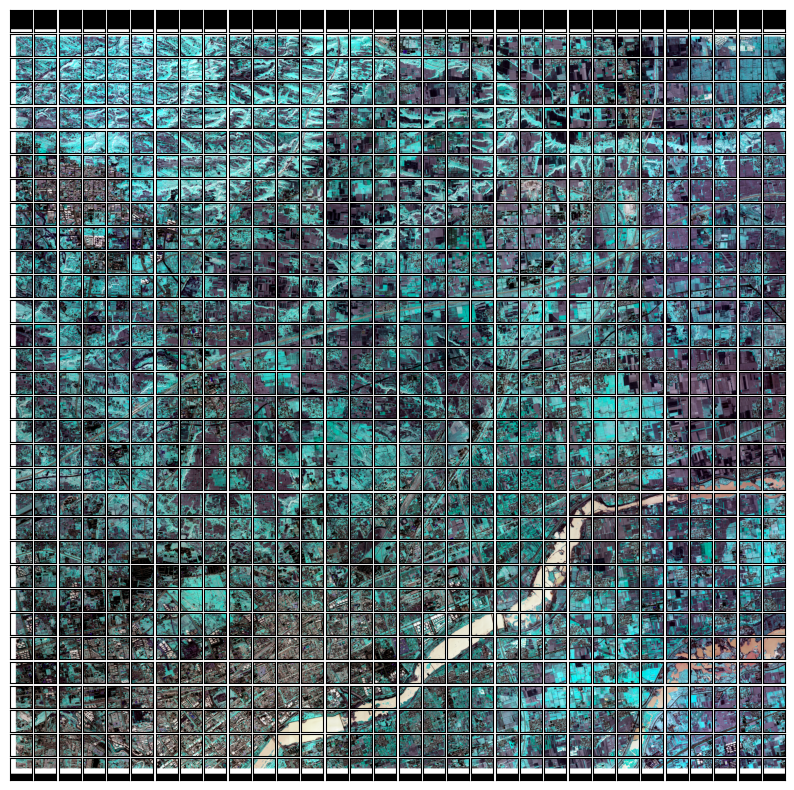

In [117]:
plot_patches(index = 1, scale = [1])